In [1]:
import numpy as np
import matplotlib.pyplot as plt 
import pandas as pd 
import seaborn as sns
import arviz as az
from sklearn import datasets
from statsmodels.tsa import stattools
import statsmodels.api as sm
import pymc3 as pm
import pymc

import sys
sys.path.insert(0, '..')
from utils.plot_lib import set_default

set_default(figsize=(6, 4))

### Classifing the [Wine](https://archive.ics.uci.edu/ml/datasets/wine) dataset with mixture models

These data are the results of a chemical analysis of wines grown in the same region in Italy but derived from three different cultivars. The analysis determined the quantities of 13 constituents found in each of the three types of wines. 

In [2]:
# Semi-supervised, quadratic discriminat analysis 
### Loading data and setting up global variables
wine = datasets.load_wine()
X = wine.data   # Load features
y = wine.target # Load targets

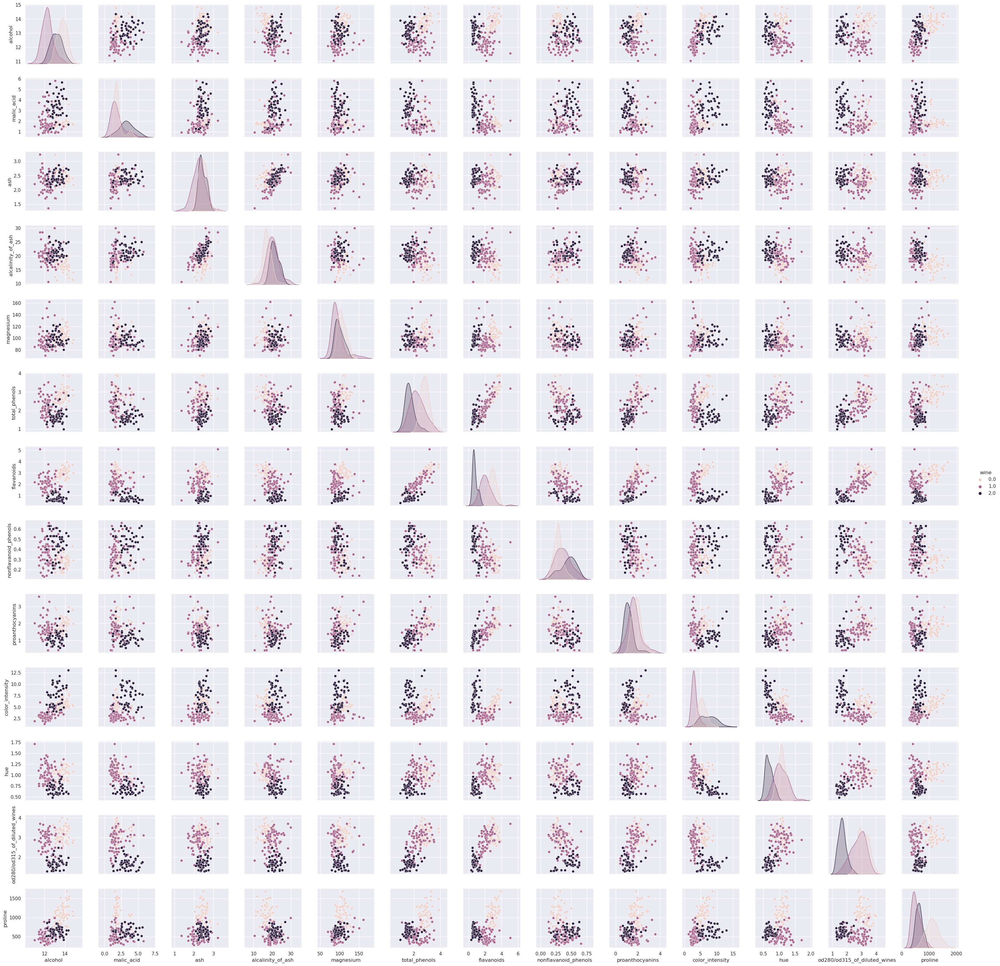

In [3]:
# Paired plot
# Paired plot using seaborn
sns.set()
# creating a dataframe for plotting
c_names = wine.feature_names
c_names.append('wine')
df = pd.DataFrame(data = np.hstack((wine.data, wine.target.reshape(-1, 1))), columns = c_names)
sns.pairplot(df[wine.feature_names], hue = "wine", diag_kind = "kde")
plt.show()

In [4]:
# Splitting dataset in train and test set
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.258, random_state=42)

print('The X Train data shape is: {}'.format(X_train.shape))
print('The X Test data shape is: {}'.format(X_test.shape))
print('The y Test data shape is: {}'.format(y_train.shape))
print('The y Train data shape is: {}'.format(y_test.shape))

The X Train data shape is: (132, 13)
The X Test data shape is: (46, 13)
The y Test data shape is: (132,)
The y Train data shape is: (46,)


### EM Mixture models for clustering

In [5]:
from scipy.stats import norm
from scipy.stats import multivariate_normal

## Clear the environment and load required libraries
np.random.seed(1)

## Setup data
# Create dataset of observations, first n belong to the training set, and the rest belong to the test set
x          = np.vstack((X_train, X_test)) 
n          = X_train.shape[0]   # Size of the training set
m          = X_test.shape[0]    # Size of the test set
p          = x.shape[1]         # Number of features
KK         = 3                  # Number of classes or componentes
y          = np.hstack((y_train, y_test))

epsilon    = 10e-5              # Stopping criteria

In [6]:
## Initialize the parameters
w     = np.ones(KK) / KK # Assign equal weight to each component to start with
mu    = multivariate_normal.rvs(mean = np.mean(x, axis = 0), cov = np.cov(x.T), size = KK)   # Random cluster centers randomly spread over the support of the data
Sigma = np.zeros((KK, p, p))  # Initial covariance mat deviation
Sigma[0] = np.cov(x.T) / KK        # Covariance matrix of first component
Sigma[1] = np.cov(x.T) / KK        # Covariance matrix of second component
Sigma[2] = np.cov(x.T) / KK       # Covariance matrix of third component

s  = 0     # Counter of the current iteration
sw = False # Decide when the algorithm will end
QQ = np.NINF  # Value of Q to monitor convergence
QQ_out = []

### EM algorithm for Clustering

In [7]:
## Initialize the parameters
w     = np.ones(KK) / KK # Assign equal weight to each component to start with
mu    = multivariate_normal.rvs(mean = np.mean(x, axis = 0), cov = np.cov(x.T), size = KK)   # Random cluster centers randomly spread over the support of the data
Sigma = np.zeros((KK, p, p))  # Initial covariance mat deviation
Sigma[0] = np.cov(x.T) / KK        # Covariance matrix of first component
Sigma[1] = np.cov(x.T) / KK        # Covariance matrix of second component
Sigma[2] = np.cov(x.T) / KK       # Covariance matrix of third component

s  = 0     # Counter of the current iteration
sw = False # Decide when the algorithm will end
KL = np.NINF  # Value of Q to monitor convergence
KL_out = []

## Checking convergence of the algorithm
while(not sw):
  ## Expectation (E) step
  v = np.zeros((n + m, KK))
  for k in range(KK): # Compute the log of the weights
    for i in range(n):
      v[i, k] = 0 if y_train[i] == k else np.NINF # Training set from 0 to n
    # Test set
    v[n: n + m, k] = np.log(w[k]) + multivariate_normal.logpdf(mean = mu[k, :], cov = Sigma[k, :, :], x = x[n: n + m], allow_singular = True) # Compute the log of the weights
  for i in range(n + m):
    v[i, :] = np.exp(v[i, :] - max(v[i, : ])) / np.sum(np.exp(v[i, :] - max(v[i, :])))  # Go from logs to actual weights in a numerically stable manner

  ## Maximization (M) step
  # Weights
  w = np.mean(v, axis = 0)
  # Mus
  mu = np.zeros((KK, p))
  for k in range(KK):
    for i in range(n + m):
      # Update Mu
      mu[k, :] = mu[k, :] + (v[i, k] * x[i, :])
    mu[k, :] = mu[k, :] / np.sum(v[:, k])

  # Standard deviations
  Sigma = np.zeros((KK, p, p))
  for k in range(KK):
    for i in range(n + m):
      # Add new axis to operate properly
      Sigma[k, :, :] = Sigma[k, :, :] + (v[i,k] * np.dot((x[i, :] - mu[k, :])[:, np.newaxis], (x[i, :] - mu[k, :])[:, np.newaxis].T))
    Sigma[k, :, :] = Sigma[k, :, :] / np.sum(v[:, k])

  #print('Mu values \n{}'.format(mu))
  #print('Sigma values \n{}'.format(Sigma))
  #print('Weight values \n{}'.format(w))

  ##Check convergence
  KLn = 0 # Value of Q function at current iteration
  for i in range(n + m):
    for k in range(KK):
      KLn = KLn + v[i, k] * (np.log(w[k]) + multivariate_normal.logpdf(mean = mu[k, :], cov = Sigma[k, :, :], x = x[i, :], allow_singular = True))

  # If relative error is less than epsilon stop
  if(np.abs(KLn - KL) / np.abs(KLn) < epsilon):
    sw = True
  KL = KLn
  KL_out.append(KL)
  s = s + 1
  print('The current convergenve value at iteration {} is {}'.format(s - 1, KLn))

The current convergenve value at iteration 0 is -3019.583161520032
The current convergenve value at iteration 1 is -2862.996041217627
The current convergenve value at iteration 2 is -2829.7556604349115
The current convergenve value at iteration 3 is -2811.5892852578804
The current convergenve value at iteration 4 is -2800.4060821355943
The current convergenve value at iteration 5 is -2798.9053842527182
The current convergenve value at iteration 6 is -2796.1768607680847
The current convergenve value at iteration 7 is -2794.261240159648
The current convergenve value at iteration 8 is -2794.2370978306108


### Computing accuracy

In [8]:
y_pred = np.argmax(v, axis = 1)[n : n + m]
# Comparison
matches = np.sum(y_test == y_pred)
acc = matches / m
print('The accuracy of the Mixture gaussian classifier is: {}'.format(acc))
print('The number of errors with the Mixture gaussian classifier are: {}'.format(m - matches))

The accuracy of the Mixture gaussian classifier is: 0.9347826086956522
The number of errors with the Mixture gaussian classifier are: 3


### Comparing agains a QDA model

In [9]:
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis as QDA

clf = QDA().fit(X_train, y_train)
y_pred_qda = clf.predict(X_test)
# Comparison
matches_qda = np.sum(y_test == y_pred_qda)
acc_qda = matches_qda / m
print('The accuracy of the QDA model is: {}'.format(acc_qda))
print('The number of errors with the QDA model are: {}'.format(m - matches_qda))

The accuracy of the QDA model is: 0.9782608695652174
The number of errors with the QDA model are: 1


Both models perform astonishingly well.